# **Traffic Sign Image Classification 96% CNN**

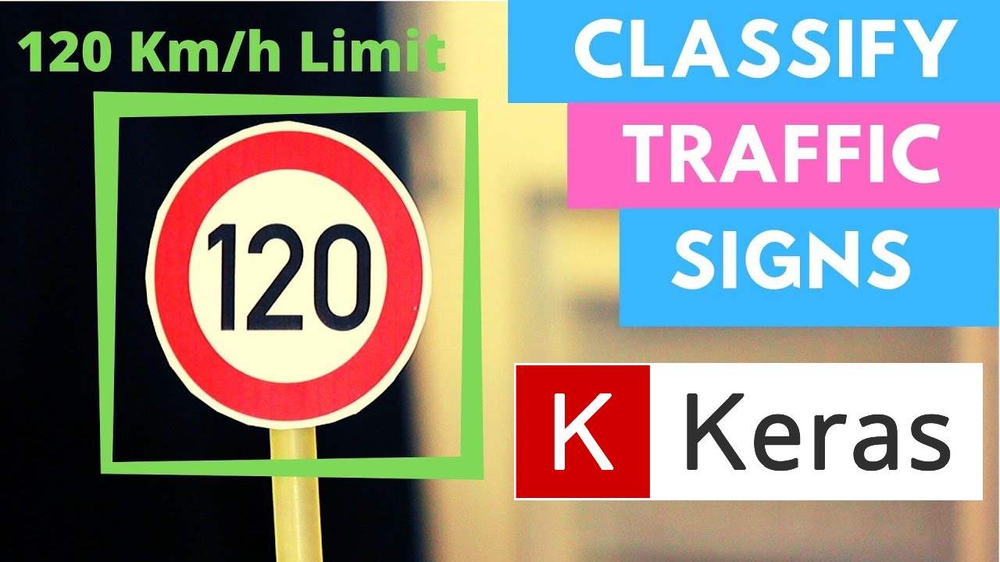


# 1. Download and Import Library

In [ ]:
! pip install tensorflow
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.3/887.3 kB 12.7 MB/s eta 0:00:00


In [ ]:
# Fundamental classes
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
from collections import Counter
import math
import random

# Image related
import cv2
from PIL import Image

# Download datataset from kaggle
import kagglehub

# For ploting
import matplotlib.pyplot as plt

# For the model and it's training
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from tensorflow.keras.utils import to_categorical
# from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout
from keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D

from keras.models import Sequential, load_model
from tensorflow import keras as kr
from tensorflow.keras.callbacks import EarlyStopping, Callback

from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# 2. Loading Dataset (Traffic Signs Images)

Tải xuống dataset biển báo giao thông 58 nhãn

In [ ]:
traffic_58_path = "/content/traffic_58"
os.makedirs(traffic_58_path, exist_ok=True)
for file_name in os.listdir(traffic_58_path):
      file_path = os.path.join(traffic_58_path, file_name)
      if os.path.isfile(file_path):  # Kiểm tra xem có phải là file không
          os.remove(file_path)

download_path = kagglehub.dataset_download("lvnduy/street-traffic-signs-in-vietnam-yolov8")
os.system(f"mv {download_path}/* {traffic_58_path}")

print("Path to dataset files:", traffic_58_path)

: 

#3. Cắt ảnh biển báo giao thông trong dataset

Duyệt qua và xử lý images và labels

In [ ]:
traffic_code_58 = ['DP.135', 'P.102', 'P.103a', 'P.103b', 'P.103c', 'P.104', 'P.106a', 'P.106b', 'P.107a', 'P.112', 'P.115', 'P.117', 'P.123a', 'P.123b', 'P.124a', 'P.124b', 'P.124c', 'P.125', 'P.127', 'P.128', 'P.130', 'P.131a', 'P.137', 'P.245a', 'R.301c', 'R.301d', 'R.301e', 'R.302a', 'R.302b', 'R.303', 'R.407a', 'R.409', 'R.425', 'R.434', 'S.509a', 'W.201a', 'W.201b', 'W.202a', 'W.202b', 'W.203b', 'W.203c', 'W.205a', 'W.205b', 'W.205d', 'W.207a', 'W.207b', 'W.207c', 'W.208', 'W.209', 'W.210', 'W.219', 'W.221b', 'W.224', 'W.225', 'W.227', 'W.233', 'W.235', 'W.245a']

def process_dataset(input_folder, output_folder, type_dataset="traffic_51"):
    # Tạo thư mục output nếu chưa tồn tại
    os.makedirs(output_folder, exist_ok=True)

    # Xóa tất cả file có trong folder
    for file_name in os.listdir(output_folder):
        file_path = os.path.join(output_folder, file_name)
        if os.path.isfile(file_path):  # Kiểm tra xem có phải là file không
            os.remove(file_path)

    images_folder = input_folder + "/images"
    labels_folder = input_folder + "/labels"

    # Danh sách kết quả: (tên file ảnh, nhãn)
    processed_data_images_path = []
    processed_data_new_labels = []
    processed_data_old_labels = []

    # Duyệt qua các file ảnh trong thư mục images
    for image_file in tqdm(os.listdir(images_folder)):
        image_path = os.path.join(images_folder, image_file)
        label_file = os.path.join(labels_folder, f"{os.path.splitext(image_file)[0]}.txt")

        # Nếu file label tương ứng tồn tại
        if os.path.exists(label_file):
            # Đọc ảnh
            image = cv2.imread(image_path)
            h, w, _ = image.shape  # Lấy chiều cao, chiều rộng của ảnh

            modified_lines = []
            # Đọc file nhãn
            with open(label_file, 'r') as lf:
                for i_line, line in enumerate(lf.readlines()):
                    parts = line.strip().split()
                    if len(parts) == 0:
                        continue
                    class_id = int(parts[0])
                    old_label = traffic_code_58[class_id]
                    if class_id is None:
                        raise ValueError(f"Invalid class ID: {class_id}")
                      # Lấy nhãn class
                    x_center, y_center, bbox_width, bbox_height = map(float, parts[1:])

                    # Tính tọa độ góc của bounding box
                    x_min = int((x_center - bbox_width / 2) * w)
                    y_min = int((y_center - bbox_height / 2) * h)
                    x_max = int((x_center + bbox_width / 2) * w)
                    y_max = int((y_center + bbox_height / 2) * h)

                    if y_max - y_min > 10 and x_max - x_min > 10:
                        # Cắt ảnh đối tượng
                        cropped_image = image[y_min:y_max, x_min:x_max]

                        # Tạo tên file mới
                        cropped_image_name = f"{os.path.splitext(image_file)[0]}_{class_id}_{i_line}.png"
                        cropped_image_path = os.path.join(output_folder, cropped_image_name)

                        # Lưu ảnh đã cắt
                        cv2.imwrite(cropped_image_path, cropped_image)

                        # Lưu nhãn tương ứng
                        processed_data_images_path.append(cropped_image_path)
                        processed_data_new_labels.append(class_id)
                        processed_data_old_labels.append(old_label)

            # train yolo thì mở 4 dòng này
                    # parts[0] = '0'  # Thay giá trị đầu tiên thành '0'
                    # modified_lines.append(' '.join(parts))

            # with open(label_file, 'w') as lf:
            #     lf.write('\n'.join(modified_lines))

    return processed_data_images_path, processed_data_new_labels, processed_data_old_labels

In [ ]:
input_folder = traffic_58_path + "/train"
output_folder = "/content/processed_images/traffic_58/train"

# Gọi hàm xử lý
images_path_58_train, new_labels_58_train, old_labels_58_train = process_dataset(input_folder, output_folder, type_dataset="traffic_58")

print(len(images_path_58_train))

100%|██████████| 9536/9536 [00:34<00:00, 273.31it/s]

15918


In [ ]:
input_folder = traffic_58_path + "/valid"
output_folder = "/content/processed_images/traffic_58/valid"

# Gọi hàm xử lý
images_path_58_val, new_labels_58_val, old_labels_58_val = process_dataset(input_folder, output_folder, type_dataset="traffic_58")

print(len(images_path_58_val))

100%|██████████| 784/784 [00:03<00:00, 236.96it/s]

1083


In [ ]:
input_folder = traffic_58_path + "/test"
output_folder = "/content/processed_images/traffic_58/test"

# Gọi hàm xử lý
images_path_58_test, new_labels_58_test, old_labels_58_test = process_dataset(input_folder, output_folder, type_dataset="traffic_58")

print(len(images_path_58_test))

100%|██████████| 613/613 [00:02<00:00, 301.75it/s]

842


#4. Tăng cường dữ liệu

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augmented_data(images_path, new_labels):
    # Thống kê số lượng ảnh trong mỗi nhãn
    label_counts = Counter(labels)

    # Số lượng mục tiêu (ví dụ: cân bằng đến 300 ảnh mỗi nhãn)
    target_count = 300

    # Tạo ImageDataGenerator để tăng cường dữ liệu
    datagen = ImageDataGenerator(
        rotation_range=15,
        brightness_range=[0.3, 1.5],
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=False,
        fill_mode="nearest"
    )

    # Tạo thư mục lưu ảnh tăng cường
    output_dir = "/content/augmented_data"
    os.makedirs(output_dir, exist_ok=True)

    # Xóa tất cả file có trong folder
    for file_name in os.listdir(output_dir):
        file_path = os.path.join(output_dir, file_name)
        if os.path.isfile(file_path):  # Kiểm tra xem có phải là file không
            os.remove(file_path)

    # Dictionary để nhóm ảnh theo nhãn
    label_to_images = {label: [] for label in label_counts.keys()}
    for path, label in zip(images_path, labels):
        label_to_images[label].append(path)

    # Tăng cường dữ liệu
    augmented_images_path = []
    augmented_labels = []

    for label, paths in label_to_images.items():
        current_count = len(paths)

        if current_count < target_count:
            print(f"Tăng cường nhãn {label} từ {current_count} đến {target_count}")

            # Thư mục con cho mỗi nhãn
            label_dir = os.path.join(output_dir, str(label))
            os.makedirs(label_dir, exist_ok=True)

            while current_count < target_count:
                for path in paths:
                    # Mở ảnh và chuyển thành numpy array
                    img = np.array(Image.open(path))
                    img = np.expand_dims(img, axis=0)  # Thêm batch dimension

                    # Tạo ảnh tăng cường
                    for batch in datagen.flow(img, batch_size=1):
                        # Lưu ảnh tăng cường vào file
                        save_path = os.path.join(label_dir, f"aug_{current_count}.jpg")
                        Image.fromarray(batch[0].astype('uint8')).save(save_path)

                        # Lưu đường dẫn và nhãn
                        augmented_images_path.append(save_path)
                        augmented_labels.append(label)

                        current_count += 1
                        if current_count >= target_count:
                            break
    return augmented_images_path, augmented_labels

In [ ]:
images_path_58_train_concat = images_path_58_train + images_path_58_val
new_labels_58_train_concat = new_labels_58_train + new_labels_58_val
augmented_train_images_path, augmented_train_labels = augmented_data(images_path_58_train_concat, new_labels_58_train_concat)

print("Tăng cường dữ liệu hoàn tất.")

Tăng cường nhãn 53 từ 225 đến 300
Tăng cường nhãn 49 từ 111 đến 300
Tăng cường nhãn 6 từ 284 đến 300
Tăng cường nhãn 15 từ 30 đến 300
Tăng cường nhãn 42 từ 21 đến 300
Tăng cường nhãn 34 từ 252 đến 300
Tăng cường nhãn 14 từ 211 đến 300
Tăng cường nhãn 13 từ 297 đến 300
Tăng cường nhãn 3 từ 41 đến 300
Tăng cường nhãn 39 từ 88 đến 300
Tăng cường nhãn 54 từ 70 đến 300
Tăng cường nhãn 2 từ 180 đến 300
Tăng cường nhãn 24 từ 88 đến 300
Tăng cường nhãn 8 từ 75 đến 300
Tăng cường nhãn 36 từ 185 đến 300
Tăng cường nhãn 32 từ 31 đến 300
Tăng cường nhãn 41 từ 167 đến 300
Tăng cường nhãn 4 từ 283 đến 300
Tăng cường nhãn 37 từ 112 đến 300
Tăng cường nhãn 29 từ 114 đến 300
Tăng cường nhãn 0 từ 64 đến 300
Tăng cường nhãn 33 từ 246 đến 300
Tăng cường nhãn 46 từ 197 đến 300
Tăng cường nhãn 38 từ 82 đến 300
Tăng cường nhãn 44 từ 162 đến 300
Tăng cường nhãn 43 từ 81 đến 300
Tăng cường nhãn 25 từ 63 đến 300
Tăng cường nhãn 16 từ 24 đến 300
Tăng cường nhãn 12 từ 44 đến 300
Tăng cường nhãn 28 từ 86 đến 300
T

#5. Visualize

## 5.1 Hiển thị ảnh của từng nhãn

In [ ]:
def display_unique_labels(images_path, labels):
    combined = list(zip(images_path, labels))
    random.shuffle(combined)
    shuffled_images_path, shuffled_labels = zip(*combined)

    n = len(set(labels))
    # Tạo dictionary để lưu ảnh đầu tiên cho mỗi nhãn
    label_to_image = {}
    for path, label in zip(shuffled_images_path, shuffled_labels):
        if label not in label_to_image:
            label_to_image[label] = path
        # Dừng nếu đã đủ số lượng nhãn cần hiển thị
        if len(label_to_image) == n:
            break

    # Lấy danh sách ảnh và nhãn duy nhất
    unique_images = list(label_to_image.values())
    unique_labels = list(label_to_image.keys())

    # Số lượng ô hiển thị (dựa trên căn bậc 2 và làm tròn lên)
    num_cells = math.ceil(math.sqrt(n))

    # Tạo lưới hiển thị
    plt.figure(figsize=(20, 20))
    for i in range(len(unique_images)):
        # Mở hình ảnh
        img = Image.open(unique_images[i])

        # Tạo subplot
        plt.subplot(num_cells, num_cells, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(img)

        # Gắn nhãn
        plt.xlabel(unique_labels[i], fontsize=10)

    plt.tight_layout()
    plt.show()

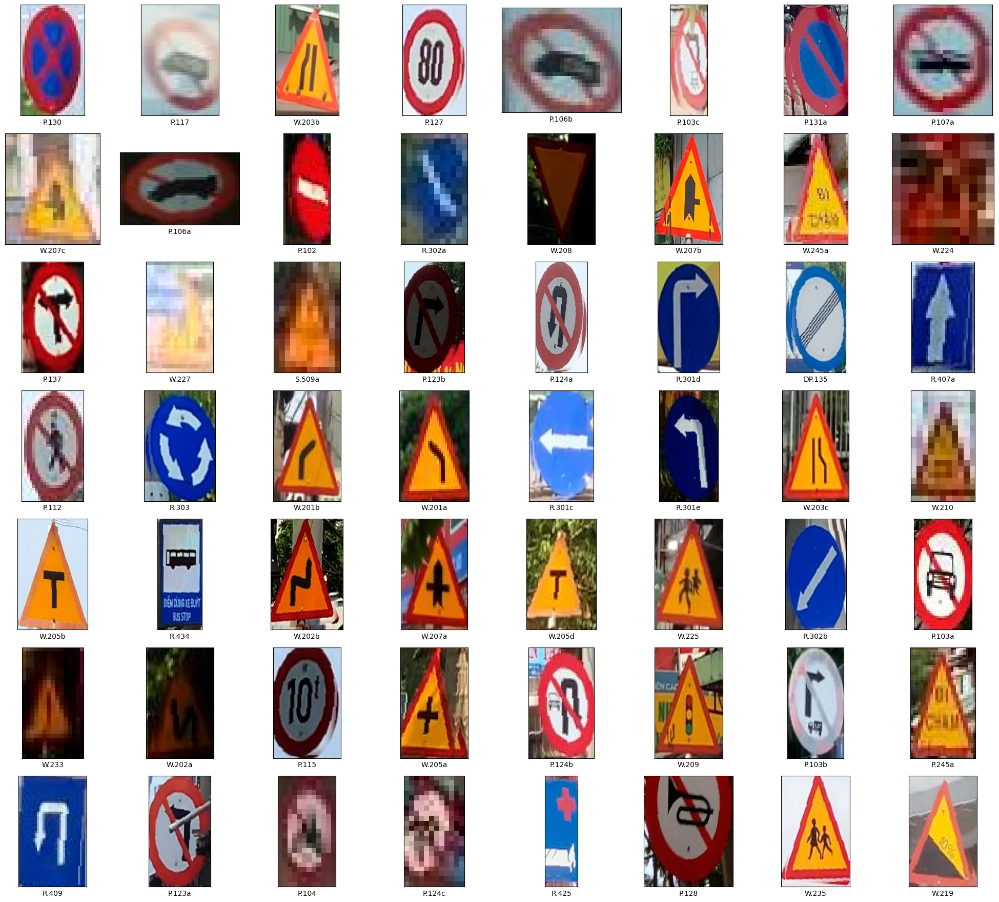

In [ ]:
# Hiển thị ảnh của tập train
display_unique_labels(images_path_58_train, old_labels_58_train)

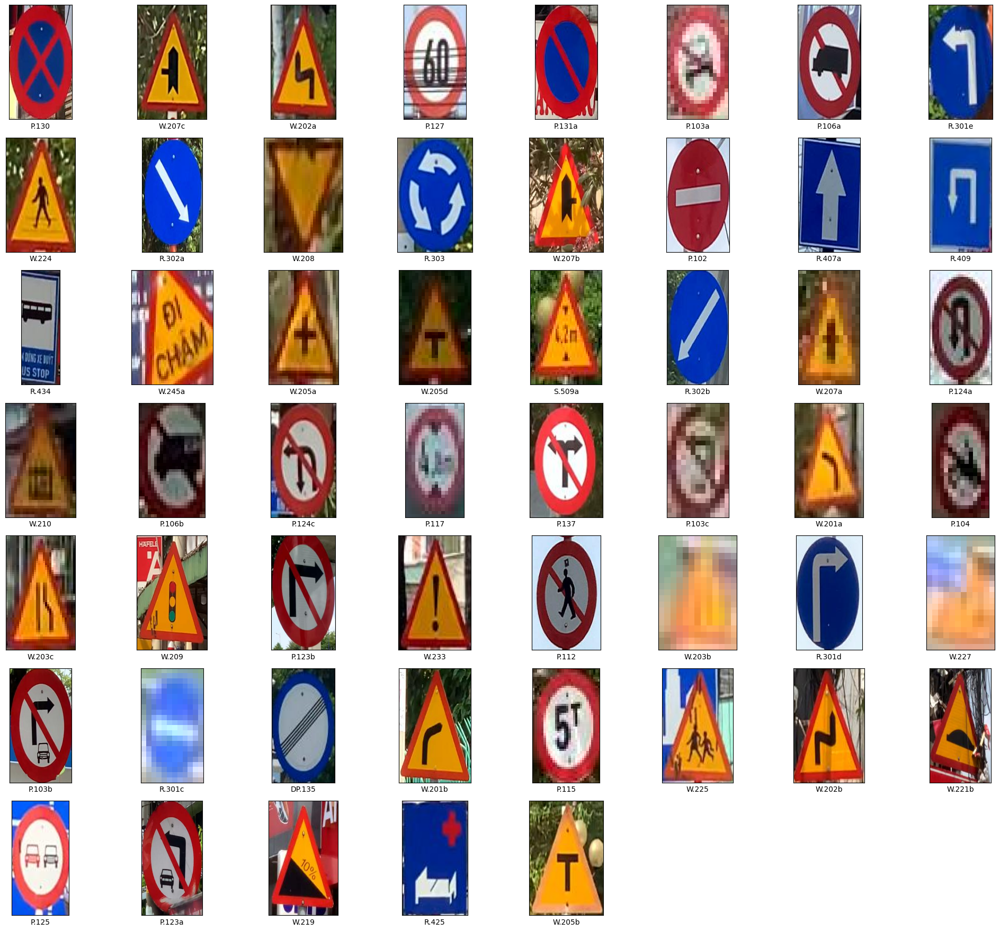

In [ ]:
# Hiển thị ảnh của tập valid
display_unique_labels(images_path_58_val, old_labels_58_val)

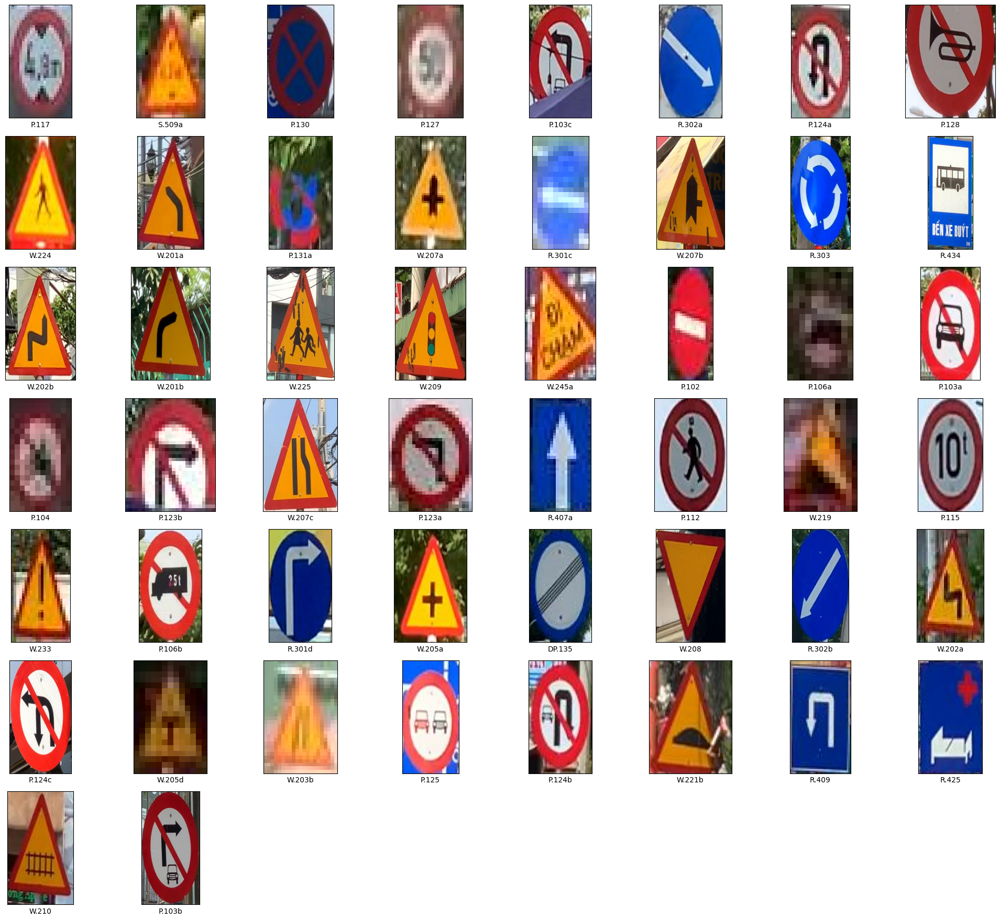

In [ ]:
# Hiển thị ảnh của tập test
display_unique_labels(images_path_58_test, old_labels_58_test)

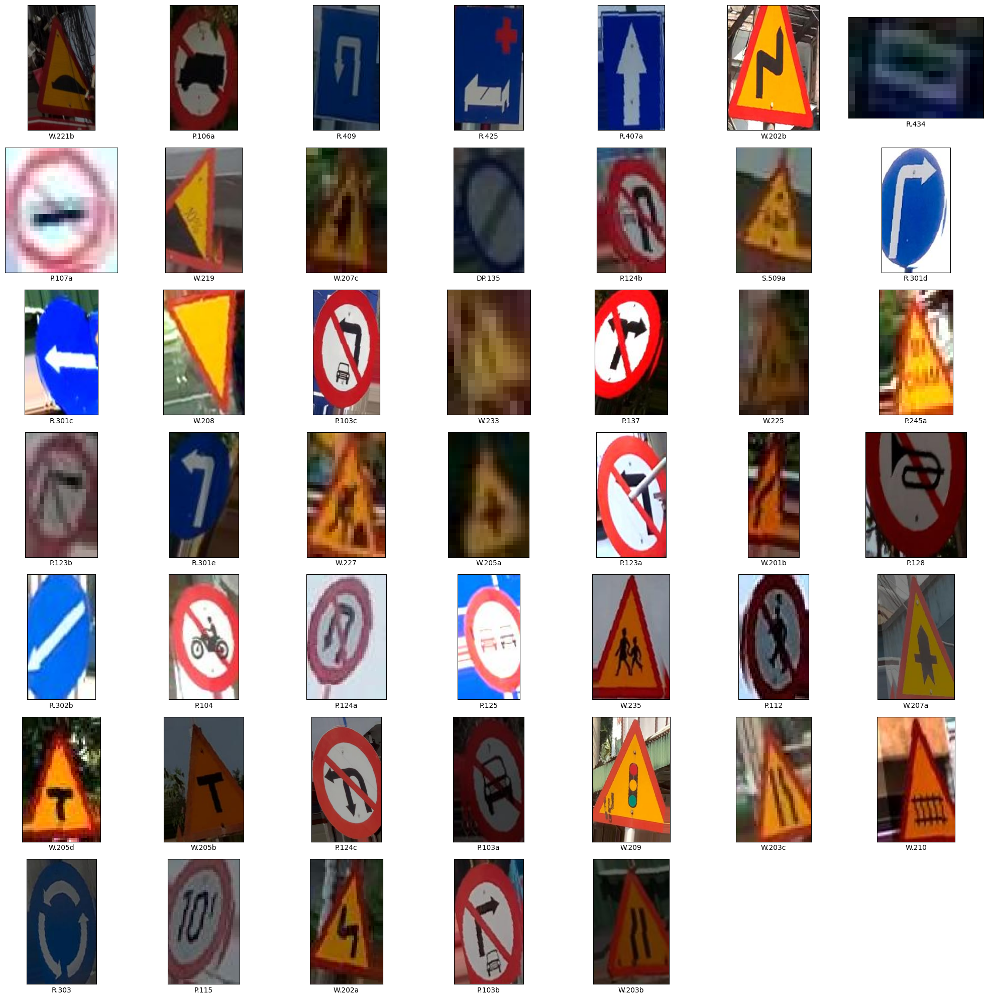

In [ ]:
# Hiển thị ảnh của tập tăng cường
def get_traffic_signs_by_indices(traffic_code_list, indices):
    return [traffic_code_list[i] for i in indices]

augmented_train_old_labels = get_traffic_signs_by_indices(traffic_code_58, augmented_train_labels)
display_unique_labels(augmented_train_images_path, augmented_train_old_labels)

## 5.2 Visualize số lượng ảnh mỗi nhãn

In [ ]:
def visualize_count(new_labels):
    # Đếm số lượng phần tử trong danh sách
    element_counts = Counter(new_labels)
    print(element_counts)

    # Chuẩn bị dữ liệu cho biểu đồ
    labels = element_counts.keys()  # Tên các phần tử
    values = element_counts.values()  # Số lượng tương ứng

    # Vẽ biểu đồ cột
    plt.bar(labels, values)

    # Thêm nhãn và tiêu đề
    plt.xlabel('Lables')
    plt.ylabel('Counts')
    plt.title('Count of Lables in List')

    # Hiển thị biểu đồ
    plt.show()

Counter({18: 3280, 20: 2280, 21: 2055, 52: 690, 45: 615, 1: 520, 57: 465, 11: 425, 27: 390, 7: 385, 35: 285, 13: 280, 6: 265, 4: 265, 34: 235, 33: 235, 53: 210, 14: 195, 46: 180, 30: 180, 36: 175, 2: 170, 41: 155, 44: 150, 49: 105, 37: 105, 29: 105, 5: 98, 39: 85, 24: 85, 31: 85, 28: 80, 8: 75, 38: 75, 55: 75, 47: 75, 43: 70, 54: 65, 0: 60, 25: 60, 22: 60, 40: 60, 48: 60, 10: 55, 9: 50, 3: 40, 12: 40, 26: 40, 15: 30, 32: 30, 42: 20, 16: 20, 19: 10, 23: 5, 56: 5, 50: 5})


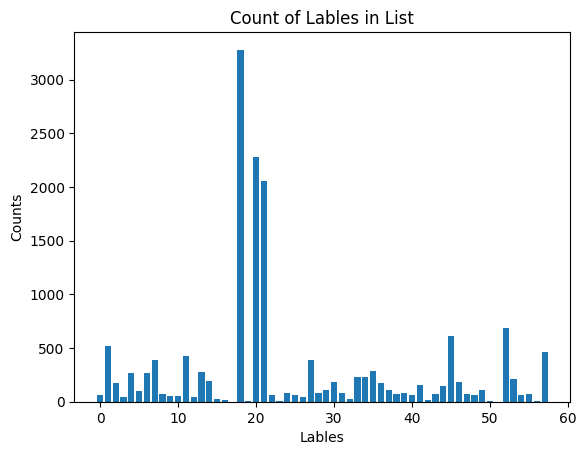

In [ ]:
visualize_count(new_labels_58_train)

Counter({18: 205, 21: 155, 20: 146, 52: 59, 45: 41, 57: 32, 1: 32, 27: 28, 35: 26, 7: 23, 11: 22, 6: 19, 4: 18, 13: 17, 34: 17, 46: 17, 14: 16, 53: 15, 44: 12, 41: 12, 33: 11, 30: 11, 43: 11, 36: 10, 2: 10, 29: 9, 47: 9, 37: 7, 31: 7, 38: 7, 5: 7, 28: 6, 49: 6, 55: 6, 40: 6, 54: 5, 16: 4, 9: 4, 12: 4, 0: 4, 25: 3, 48: 3, 10: 3, 39: 3, 24: 3, 22: 3, 50: 2, 26: 2, 42: 1, 3: 1, 17: 1, 51: 1, 32: 1})


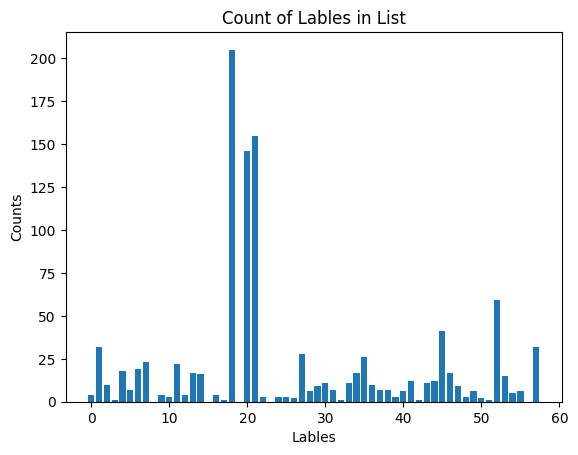

In [ ]:
visualize_count(new_labels_58_val)

Counter({18: 171, 21: 129, 20: 110, 52: 41, 45: 35, 1: 32, 27: 26, 11: 20, 57: 19, 33: 17, 13: 17, 14: 15, 35: 14, 29: 14, 34: 13, 4: 13, 36: 13, 44: 12, 53: 11, 7: 9, 41: 9, 2: 8, 30: 8, 6: 8, 38: 7, 46: 7, 28: 6, 47: 5, 9: 5, 10: 4, 50: 3, 48: 3, 39: 3, 24: 3, 55: 3, 25: 3, 37: 3, 5: 3, 31: 3, 43: 3, 49: 2, 16: 2, 19: 2, 0: 2, 3: 1, 17: 1, 51: 1, 32: 1, 12: 1, 15: 1})


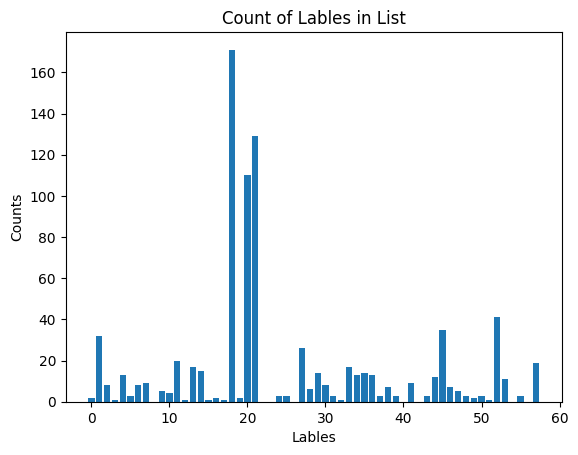

In [ ]:
visualize_count(new_labels_58_test)

Counter({18: 3485, 20: 2426, 21: 2210, 52: 749, 45: 656, 13: 596, 6: 583, 4: 582, 1: 552, 34: 551, 33: 545, 53: 524, 14: 510, 57: 497, 46: 496, 30: 490, 36: 484, 2: 479, 41: 466, 44: 461, 11: 447, 27: 418, 29: 413, 37: 411, 49: 410, 7: 408, 5: 404, 31: 391, 39: 387, 24: 387, 28: 385, 47: 383, 38: 381, 43: 380, 55: 380, 8: 374, 54: 369, 40: 365, 0: 363, 25: 362, 22: 362, 48: 362, 10: 357, 9: 353, 12: 343, 26: 341, 3: 340, 32: 330, 15: 329, 16: 323, 42: 320, 35: 311, 19: 309, 50: 306, 23: 304, 56: 304, 17: 300, 51: 300})


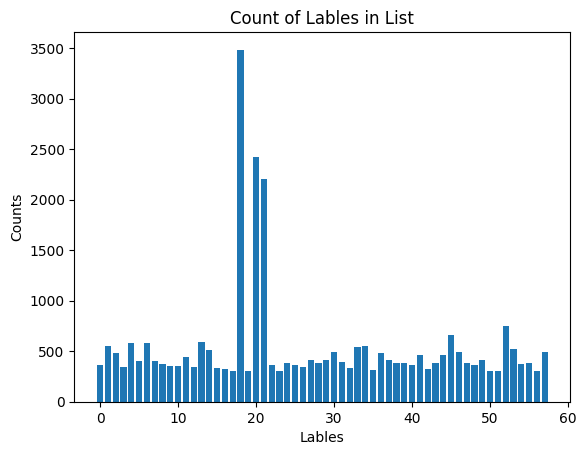

In [ ]:
images_path_58_train_concat += augmented_train_images_path
new_labels_58_train_concat += augmented_train_labels

visualize_count(new_labels_58_train_concat)

# 6. Train YOLO model

In [ ]:
def trainYOLO():
    print('Load YOLOv8n weight.')
    model = YOLO('/content/yolov8_trafficsign.pt')

    print('Start training on traffic signs datasets.')
    train = model.train(
        data='/content/traffic_58/data.yaml',
        epochs=10,
        imgsz=640,
        device=0,
        batch=64,
        visualize=True)
    print('Save weight of model')
    model.save('/content/yolov8_trafficsign_22_11.pt')

trainYOLO()

Load YOLOv8n weight.


FileNotFoundError: [Errno 2] No such file or directory: '/content/yolov8_trafficsign.pt'

# 7. Train mô hình phân loại biển báo giao thông

## 7.1 Chuyển hình ảnh thành array

In [ ]:
# Khởi tạo danh sách images_path và labels
def convert_img_to_array(images_path, labels):
    images_array = []

    for image_path in tqdm(images_path):
        try:
            image = cv2.imread(image_path)
            image = cv2.resize(image, (80, 80))

            image = kr.applications.mobilenet.preprocess_input(image)
            images_array.append(image)

        except Exception as e:
            print(f"Error loading image {image_path}: {e}")

    # Chuyển đổi danh sách thành mảng numpy
    images_array = np.array(images_array)
    labels = np.array(labels)

    return images_array, labels

In [ ]:
images_array_train, labels_train = convert_img_to_array(images_path_58_train_concat, new_labels_58_train_concat)
print(images_array_train.shape, labels_train.shape)

labels_train = to_categorical(labels_train, 58)

100%|██████████| 31054/31054 [00:15<00:00, 2024.09it/s]


(31054, 80, 80, 3) (31054,)


In [ ]:
images_array_val, labels_val = convert_img_to_array(images_path_58_val, new_labels_58_val)
print(images_array_val.shape, labels_val.shape)

labels_val = to_categorical(labels_val, 58)

100%|██████████| 1083/1083 [00:00<00:00, 2099.98it/s]


(1083, 80, 80, 3) (1083,)


In [ ]:
images_array_test, labels_test = convert_img_to_array(images_path_58_test, new_labels_58_test)
print(images_array_test.shape, labels_test.shape)

labels_test = to_categorical(labels_test, 58)

100%|██████████| 842/842 [00:00<00:00, 1999.03it/s]

(842, 80, 80, 3) (842,)


## 7.2 Khởi tạo model classification

In [ ]:
HEIGHT = 80
WIDTH = 80
N_CHANNELS = 3
EPOCHS = 100
BS = 64
INIT_LR = 1e-3
NUM_LABELS = 58

In [ ]:
mobilenet = kr.applications.MobileNet(
    include_top=False,
    weights="imagenet",
    input_shape=(HEIGHT, WIDTH, N_CHANNELS),
)
for layer in mobilenet.layers:
    layer.trainable = False

model = Sequential()
model.add(mobilenet)
model.add(GlobalAveragePooling2D())
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(NUM_LABELS, activation='softmax'))

opt = tf.keras.optimizers.AdamW(learning_rate=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])
model.summary()

<ipython-input-41-25f138bbab7e>:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = kr.applications.MobileNet(


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py:33: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenet_1.00_224 (Functional)      │ (None, 2, 2, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 58)                  │           7,482 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,925,370 (14.97 MB)

 Trainable params: 696,506 (2.66 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [ ]:
earlystop = EarlyStopping(
    monitor='val_accuracy',
    patience=8,
    verbose=1,
    restore_best_weights=True
)

## 7.3. Training the Model

In [ ]:
# Training the Model
with tf.device('/GPU:0'):
    history = model.fit(
        images_array_train,
        labels_train,
        batch_size=BS,
        epochs=EPOCHS,
        validation_data=(images_array_test, labels_test),
        callbacks=[earlystop]
    )

Epoch 1/100
486/486 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - accuracy: 0.2750 - loss: 3.1268 - val_accuracy: 0.8112 - val_loss: 0.6951
Epoch 2/100
486/486 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - accuracy: 0.6918 - loss: 1.0510 - val_accuracy: 0.8587 - val_loss: 0.4604
Epoch 3/100
486/486 ━━━━━━━━━━━━━━━━━━━━ 15s 12ms/step - accuracy: 0.7935 - loss: 0.6954 - val_accuracy: 0.8824 - val_loss: 0.3722
Epoch 4/100
486/486 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8369 - loss: 0.5392 - val_accuracy: 0.9062 - val_loss: 0.2890
Epoch 5/100
486/486 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8642 - loss: 0.4572 - val_accuracy: 0.9157 - val_loss: 0.2754
Epoch 6/100
486/486 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.8835 - loss: 0.4013 - val_accuracy: 0.9145 - val_loss: 0.2865
Epoch 7/100
486/486 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.8925 - loss: 0.3612 - val_accuracy: 0.9264 - val_loss: 0.2289
Epoch 8/100
486/486 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.9012 - loss: 0.3

## 7.4. Visualizing the performance of the Model during Training Phase

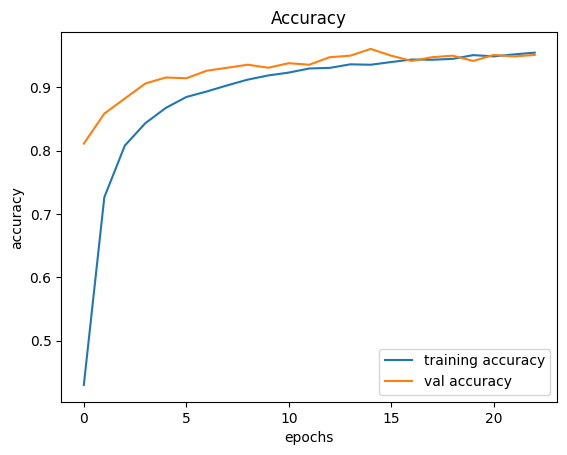

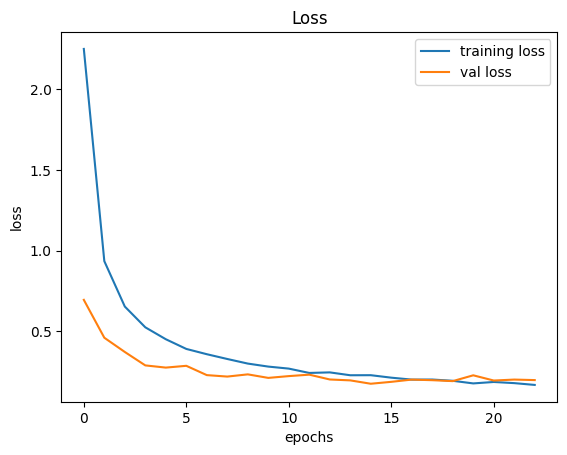

In [ ]:
# Plotting performance graphs
plt.figure(0)
plt.plot(history.history['accuracy'], label='training accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

plt.figure(1)
plt.plot(history.history['loss'], label='training loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

## 7.5 Loading Test Dataset and Evaluating the Model

In [ ]:
with tf.device('/GPU:0'):
    pred = model.predict(images_array_test)
    predictions = np.argmax(pred, axis=1) # return to label
    ytest = list(map(lambda x: np.argmax(x), labels_test))

    accuracy = accuracy_score(ytest, predictions)
    print("Accuracy : %.2f%%" % (accuracy*100.0))

    prec, rec, f1, _ = precision_recall_fscore_support(ytest, predictions)
    print(f'Precision: {round((np.average(prec) * 100), 2)}')
    print(f'Recall: {round((np.average(rec) * 100), 2)}')
    print(f'F1: {round((np.average(f1) * 100), 2)}')


27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step
Accuracy : 96.08%
Precision: 88.7
Recall: 87.41
F1: 87.64


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## 7.6. Saving the Model

In [ ]:
# Saving the Model
model.save('traffic_classifier.h5')

# 8. Test

## 8.1 Code func test

In [ ]:
import cv2
import numpy as np
import requests
from tensorflow.keras.models import load_model
from ultralytics import YOLO
import tensorflow as tf
from PIL import Image
import io
from google.colab.patches import cv2_imshow

conf_threshold = 0.5
target_size = (80, 80)

labels = ['DP.135', 'P.102', 'P.103a', 'P.103b', 'P.103c', 'P.104', 'P.106a', 'P.106P', 'P.107a', 'P.112', 'P.115',
          'P.117', 'P.123a', 'P.123b', 'P.124a', 'P.124b', 'P.124c', 'P.125', 'P.127', 'P.128', 'P.130', 'P.131a',
          'P.137', 'P.245a', 'R.301c', 'R.301d', 'R.301e', 'R.302a', 'R.302b', 'R.303', 'R.407a', 'R.409', 'R.425',
          'R.434', 'S.509a', 'W.201a', 'W.201b', 'W.202a', 'W.202b', 'W.203b', 'W.203c', 'W.205a', 'W.205b',
          'W.205d', 'W.207a', 'W.207b', 'W.207c', 'W.208', 'W.209', 'W.210', 'W.219', 'W.221b', 'W.224', 'W.225',
          'W.227', 'W.233', 'W.235', 'W.245a']

# Load models
yolo_model = YOLO('/content/yolov8_trafficsign_22_11.pt')
classifier_model = load_model('/content/traffic_classifier.h5')

def preprocess_frame(roi):
    roi = cv2.resize(roi, target_size)
    roi = np.expand_dims(roi, axis=0)
    roi = tf.keras.applications.mobilenet.preprocess_input(roi)
    return roi

def download_image_from_url(source):
    if source.startswith(('http://', 'https://')):  # Nếu là URL
        response = requests.get(source)
        img = Image.open(io.BytesIO(response.content))
        img = np.array(img)
        if len(img.shape) == 3 and img.shape[2] == 3:
            img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    else:  # Nếu là đường dẫn local
        img = cv2.imread(source)
    return img

def classify_traffic(image_url):
    frame = download_image_from_url(image_url)
    roi = preprocess_frame(frame)
    predictions = classifier_model.predict(roi, verbose=0)[0]
    label_id = np.argmax(predictions)
    confidence = predictions[label_id]
    cv2_imshow(frame)

    return labels[label_id], confidence

def detect_and_classify_traffic_signs_from_url(image_url, output_path=None):
    # Download and load image from URL
    frame = download_image_from_url(image_url)

    # Run detection
    detections = yolo_model(frame, conf=conf_threshold, imgsz=640)
    predict_label = []
    for detect in detections:
        for bbox in detect.boxes.xyxy:
            x1, y1, x2, y2 = map(int, bbox)

            roi = frame[y1:y2, x1:x2]
            if roi.size == 0:
                continue

            roi = preprocess_frame(roi)
            predictions = classifier_model.predict(roi, verbose=0)[0]

            label_id = np.argmax(predictions)
            confidence = predictions[label_id]
            predict_label.append(labels[label_id])
            print(predict_label, confidence)
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f'{labels[label_id]} {confidence:.2f}', (x1, y1 - 10),
                      cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    if output_path:
        cv2.imwrite(output_path, frame)

    # Display the result
    # cv2.imshow('Traffic Signs Detection', frame)
    cv2_imshow(frame)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return predict_label

## 8.2 Hiển thị ảnh của nhãn đã dự đoán để dể hình dung

In [ ]:
def display_unique_labels(images_path, labels, predict):
    if len(predict) == 0:
        return

    n = 3

    combined = list(zip(images_path, labels))
    random.shuffle(combined)
    shuffled_images_path, shuffled_labels = zip(*combined)

    # Tạo dictionary để lưu ảnh đầu tiên cho mỗi nhãn
    label_to_image = {}
    for path, label in zip(shuffled_images_path, shuffled_labels):
        if label in predict:
            if label in label_to_image.keys():
                label_to_image[label].append(path)
            else:
                label_to_image[label] = [path]

    # Tạo lưới hiển thị
    plt.figure(figsize=(6*len(predict), 8))
    for i, label  in enumerate(predict):
        for j in range(n):
            # Mở hình ảnh
            img = Image.open(label_to_image[label][j])

            # Tạo subplot
            plt.subplot(len(predict), n, i*n + j + 1)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.imshow(img)

            # Gắn nhãn
            plt.xlabel(label, fontsize=10)

    plt.tight_layout()
    plt.show()

## 8.3 Test với image từ url


0: 416x640 1 DP.135, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
['R.303'] 1.0


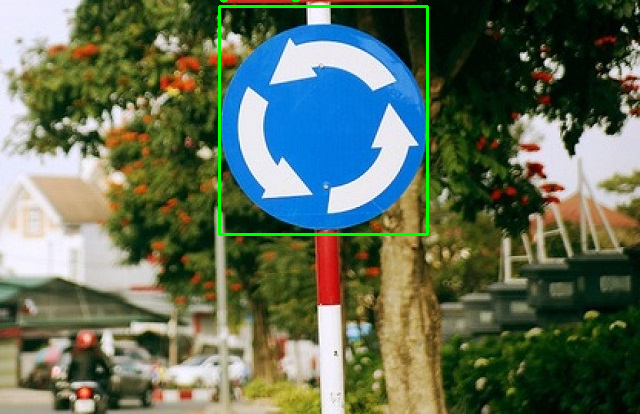

Ảnh của nhãn trên tập train


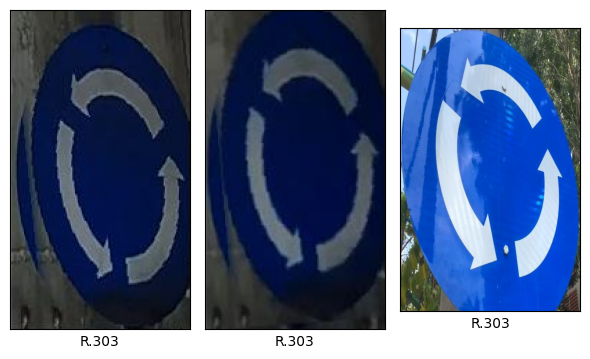

In [ ]:
# Run with an image URL
image_url = "https://vantaitrungtin.com/wp-content/uploads/2022/01/bien-hieu-lenh-1.jpg"
output_path = "output_image.jpg"
predict_label = detect_and_classify_traffic_signs_from_url(image_url, output_path)

print("Ảnh của nhãn trên tập train")
display_unique_labels(images_path_58_train, old_labels_58_train, predict_label)


0: 448x640 1 DP.135, 10.6ms
Speed: 4.1ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)
['P.130'] 0.9999378


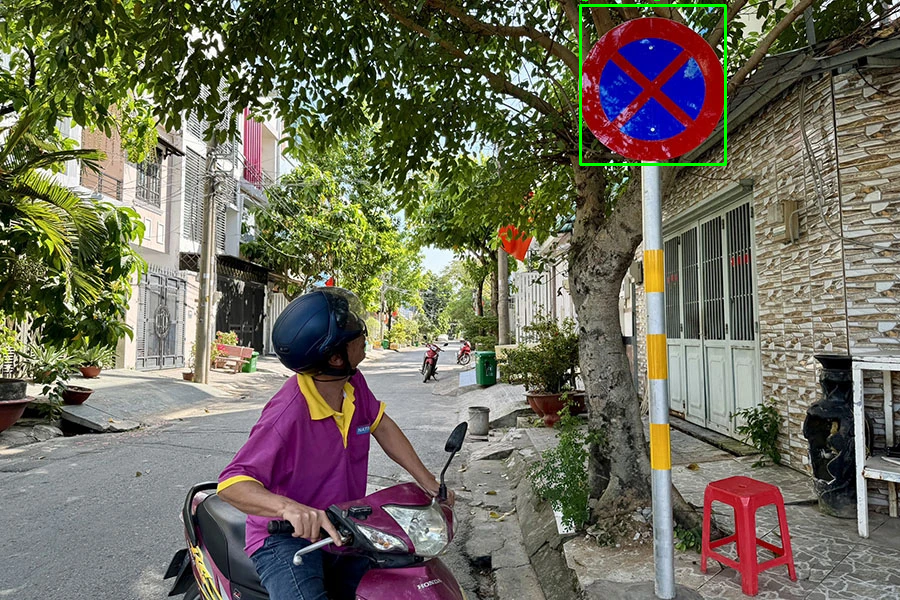

Ảnh của nhãn trên tập train


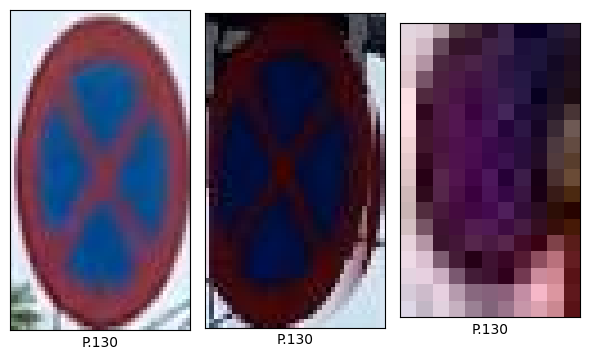

In [ ]:
# Run with an image URL
image_url = "https://image.plo.vn/w1000/Uploaded/2024/pwvotwiv/2023_12_25/hinh1-bien-bao-ggiao-thong-26-12-3691-3685.jpg.webp"
output_path = "output_image.jpg"
predict_label = detect_and_classify_traffic_signs_from_url(image_url, output_path)

print("Ảnh của nhãn trên tập train")
display_unique_labels(images_path_58_train, old_labels_58_train, predict_label)


0: 448x640 1 DP.135, 7.7ms
Speed: 1.6ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)
['P.102'] 1.0


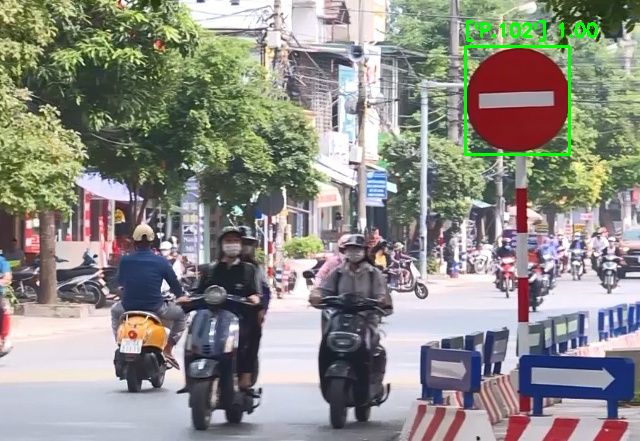

Ảnh của nhãn trên tập train


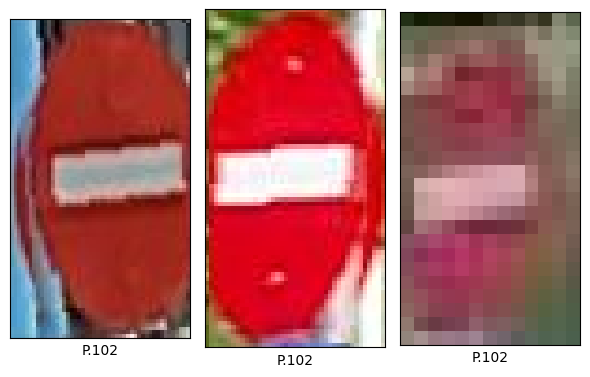

In [ ]:
# Run with an image URL
image_url = "https://truyenhinhthanhhoa.qltns.mediacdn.vn/thumb_w/640/dataimages/202110/original/resize_images5725125_Screenshot_13.jpg"
output_path = "output_image.jpg"
predict_label = detect_and_classify_traffic_signs_from_url(image_url, output_path)

print("Ảnh của nhãn trên tập train")
display_unique_labels(images_path_58_train, old_labels_58_train, predict_label)


0: 416x640 3 DP.135s, 9.0ms
Speed: 2.8ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
['P.117'] 0.9999857
['P.117', 'R.302a'] 0.9999378
['P.117', 'R.302a', 'P.102'] 0.99352396


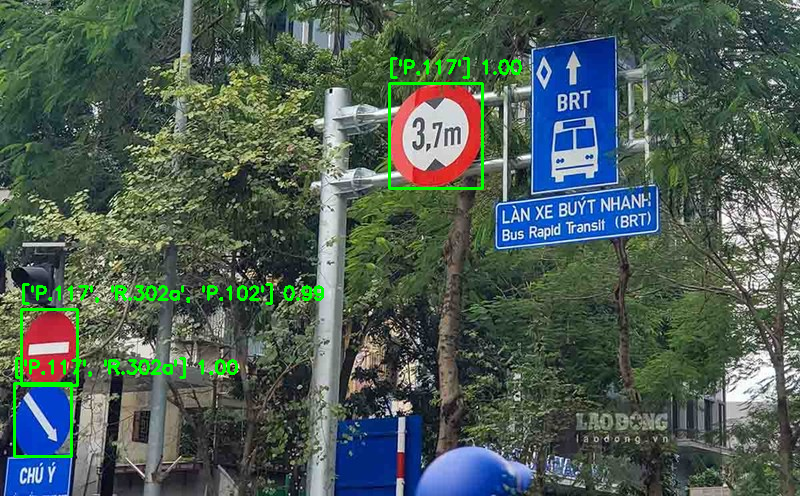

Ảnh của nhãn trên tập train


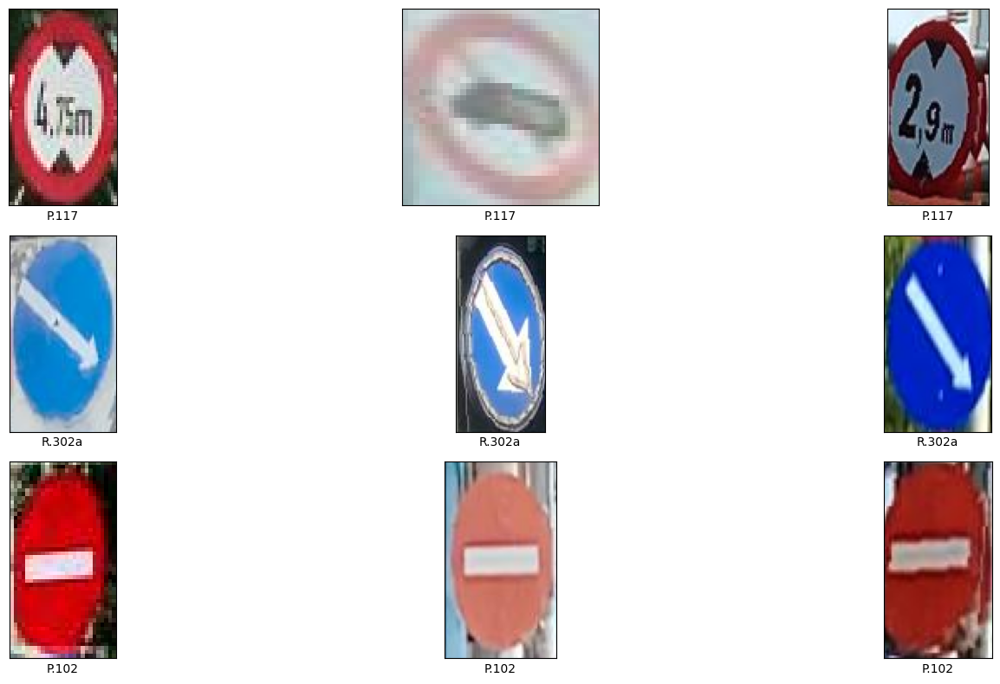

In [ ]:
# Run with an image URL
image_url = "https://media-cdn-v2.laodong.vn/storage/newsportal/2023/12/20/1282429/Brt-Ha-Noi.jpg?w=800&h=496&crop=auto&scale=both"
output_path = "output_image.jpg"
predict_label = detect_and_classify_traffic_signs_from_url(image_url, output_path)

print("Ảnh của nhãn trên tập train")
display_unique_labels(images_path_58_train, old_labels_58_train, predict_label)

## 8.4 Test với ảnh từ path

In [ ]:
# Run with an image URL
image_url = "/content/11.JPG"
output_path = "output_image.jpg"
predict_label = detect_and_classify_traffic_signs_from_url(image_url, output_path)

print("Ảnh của nhãn trên tập train")
display_unique_labels(images_path_58_train, old_labels_58_train, predict_label)

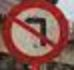

P.123b 0.6311376
Ảnh của nhãn trên tập train


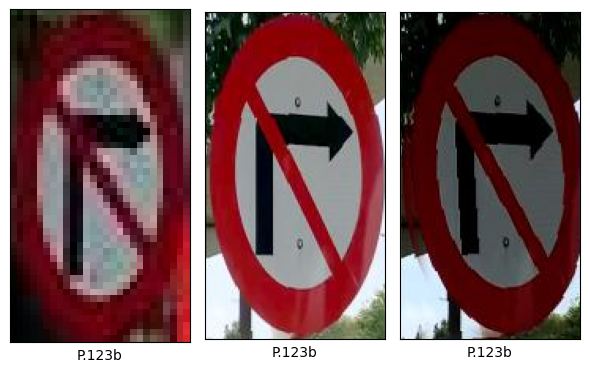

In [ ]:
image_url = "/content/11.JPG"
predict_label, conf = classify_traffic(image_url)

print(predict_label, conf)

print("Ảnh của nhãn trên tập train")
display_unique_labels(images_path_58_train, old_labels_58_train, [predict_label])